<a href="https://colab.research.google.com/github/pooriaazami/WGAN-GP-pytorch-/blob/main/WGAN_GP%5Bpytorch%5D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms

import numpy as np

import matplotlib.pyplot as plt

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [3]:
BATCH_SIZE = 128
N_NOISE = 100

GENERATOR_FILTERS = 64
CRITIC_FILTERS = 64
N_CHANNELS = 3

LAMBDA = 10
lr = 0.0001
beta1 = 0
beta2 = .9

In [4]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((.5, .5, .5), (.5, .5, .5))
])

trainset = torchvision.datasets.CIFAR10(root='./data',
                                        train=True,
                                        download=True,
                                        transform=transform
)

trainloader = torch.utils.data.DataLoader(trainset,
                                          batch_size=BATCH_SIZE,
                                          shuffle=True,
                                          num_workers=2)

Files already downloaded and verified


In [5]:
class Generator(nn.Module):
  def __init__(self):
    super().__init__()

    self.layers = nn.Sequential(
        nn.ConvTranspose2d(in_channels=N_NOISE,
                           out_channels=GENERATOR_FILTERS*8,
                           kernel_size=4,
                           stride=1,
                           bias=False),
      nn.BatchNorm2d(GENERATOR_FILTERS*8),
      nn.ReLU(),

      nn.ConvTranspose2d(in_channels=GENERATOR_FILTERS*8,
                         out_channels=GENERATOR_FILTERS*4,
                         kernel_size=4,
                         stride=2,
                         padding=1,
                         bias=False),
      nn.BatchNorm2d(GENERATOR_FILTERS*4),
      nn.ReLU(),

      nn.ConvTranspose2d(in_channels=GENERATOR_FILTERS*4,
                         out_channels=GENERATOR_FILTERS*2,
                         kernel_size=4,
                         stride=2,
                         padding=1,
                         bias=False),
      nn.BatchNorm2d(GENERATOR_FILTERS*2),
      nn.ReLU(),

      nn.ConvTranspose2d(in_channels=GENERATOR_FILTERS*2,
                         out_channels=GENERATOR_FILTERS,
                         kernel_size=4,
                         stride=2,
                         padding=1,
                         bias=False),
      nn.BatchNorm2d(GENERATOR_FILTERS),
      nn.ReLU(),

      nn.ConvTranspose2d(in_channels=GENERATOR_FILTERS,
                         out_channels=N_CHANNELS,
                         kernel_size=1,
                         stride=1,
                         bias=False),
      nn.BatchNorm2d(N_CHANNELS),
      nn.Tanh(),
    )

  def forward(self, noise):
    return self.layers(noise)

In [6]:
class Critic(nn.Module):
  def __init__(self):
    super().__init__()

    self.layers = nn.Sequential(
        nn.Conv2d(in_channels=N_CHANNELS, 
                  out_channels=CRITIC_FILTERS,
                  kernel_size=4,
                  stride=2, 
                  padding=1, 
                  bias=False),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=CRITIC_FILTERS, 
                  out_channels=CRITIC_FILTERS * 2, 
                  kernel_size=4, 
                  stride=2, 
                  padding=1, 
                  bias=False),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=CRITIC_FILTERS * 2, 
                  out_channels=CRITIC_FILTERS * 4, 
                  kernel_size=4, 
                  stride=2, 
                  padding=1,
                  bias=False),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=CRITIC_FILTERS * 4, 
                  out_channels=CRITIC_FILTERS * 8, 
                  kernel_size=4, 
                  stride=2, 
                  padding=1,
                  bias=False),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=CRITIC_FILTERS * 8, 
          out_channels=1, 
          kernel_size=4, 
          stride=2, 
          padding=1, 
          bias=False),

    )

  def forward(self, x):
    return self.layers(x)

In [8]:
generator = Generator().to(device)
critic = Critic().to(device)

In [9]:
generator_optimizer = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))
critic_optimizer = optim.Adam(critic.parameters(), lr=lr, betas=(beta1, beta2))

In [10]:
def gradient_penalty(real_images, fake_images):
  eps = torch.rand(real_images.shape[0], 1, 1, 1).to(device)
  eps = eps.expand_as(real_images)

  interpolation = eps * real_images + (1 - eps) * fake_images
  scores = critic(interpolation)

  grad_outputs = torch.ones_like(scores)

  gradients = autograd.grad(
      outputs=scores,
      inputs=interpolation,
      grad_outputs=grad_outputs,
      create_graph=True,
      retain_graph=True
  )[0]

  gradients = gradients.view(BATCH_SIZE, -1)
  gradient_norm = gradients.norm(2, 1)
  penalty = torch.mean((gradient_norm - 1) ** 2)

  return penalty

def critic_loss(real_scores, fake_scores):
  real_scores = real_scores.mean()
  fake_scores = fake_scores.mean()

  error = fake_scores - real_scores
  return error

def generator_loss(generated_score):
  return -generated_score.mean()

In [11]:
def plot_generated_images(noise):
  with torch.no_grad():
    n_images = noise.shape[0]
    generated_images = generator(noise).detach().cpu().numpy()

    fig, axs = plt.subplots(1, n_images, figsize=(10, 5))
    for i in range(n_images):
      img = (generated_images[i] + 1) / 2
      img = np.transpose(img, (1, 2, 0))
      axs[i].imshow(img)

    plt.show()

critic loss: 7.502802848815918
generator loss: 0.1796562373638153



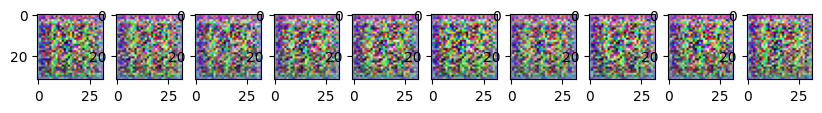

critic loss: 6.357418060302734
generator loss: -0.2788572907447815



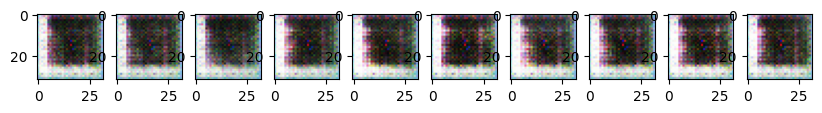

critic loss: 3.8639590740203857
generator loss: 6.26025915145874



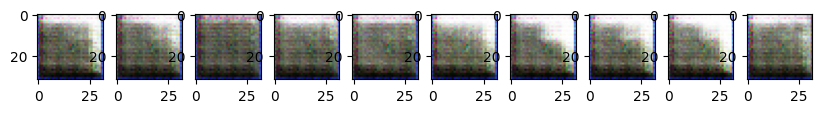

critic loss: 3.7331929206848145
generator loss: 3.3858652114868164



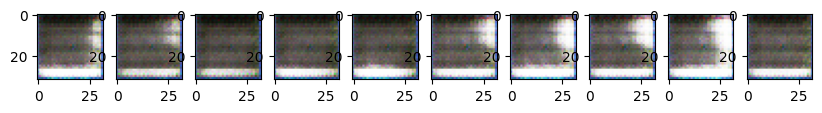

critic loss: 2.3222503662109375
generator loss: 1.2471760511398315



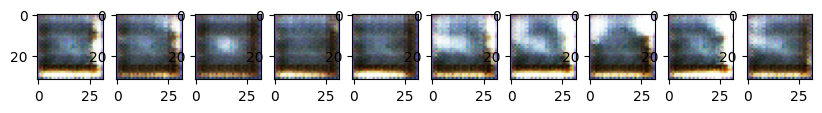

critic loss: 3.4000132083892822
generator loss: 0.5767199993133545



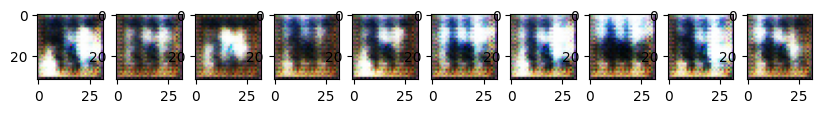

critic loss: 1.4856774806976318
generator loss: 2.2553038597106934



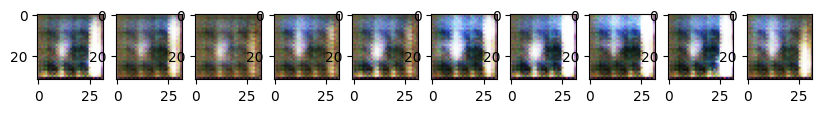

critic loss: 1.1056606769561768
generator loss: 1.1295071840286255



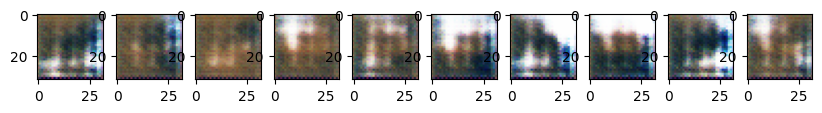

critic loss: 0.34835177659988403
generator loss: 0.10591685026884079



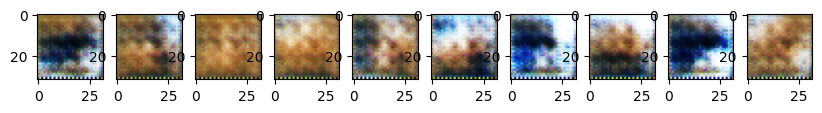

critic loss: -2.104205846786499
generator loss: 3.3495402336120605



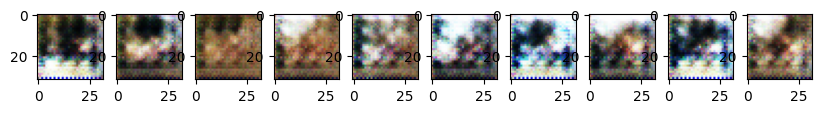

critic loss: 1.3532912731170654
generator loss: -0.5145590305328369



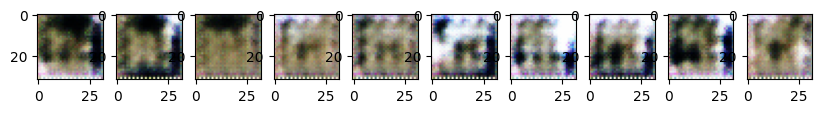

critic loss: 1.3575530052185059
generator loss: -0.3800579011440277



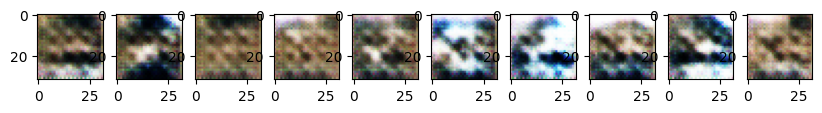

critic loss: 1.1076138019561768
generator loss: 0.8696119785308838



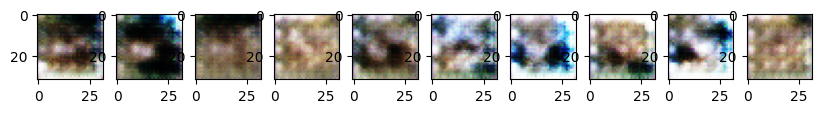

critic loss: 0.9485282301902771
generator loss: 0.1918308436870575



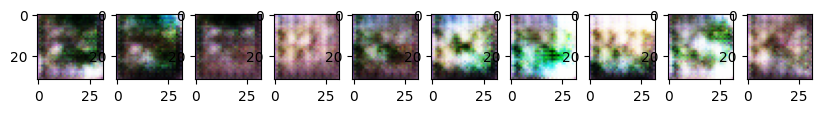

critic loss: 0.9097429513931274
generator loss: 0.4238464832305908



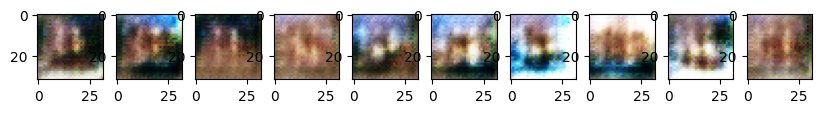

critic loss: 0.33551299571990967
generator loss: 1.5981439352035522



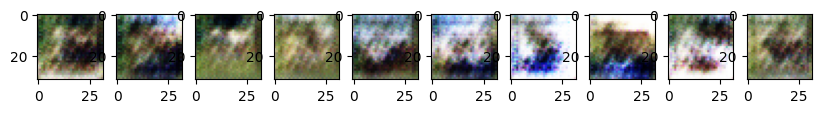

critic loss: 0.684870719909668
generator loss: 0.13617238402366638



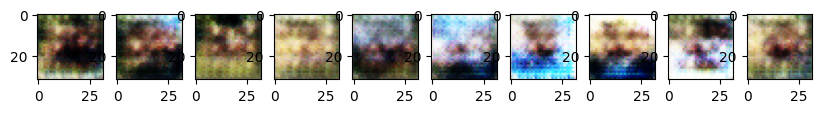

critic loss: 0.5778734087944031
generator loss: 0.3246094286441803



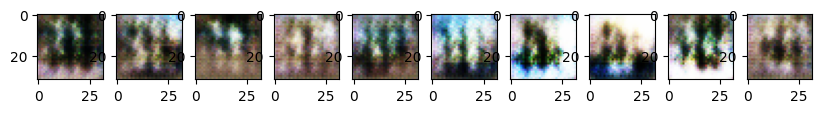

critic loss: 0.9734928607940674
generator loss: 0.13388197124004364



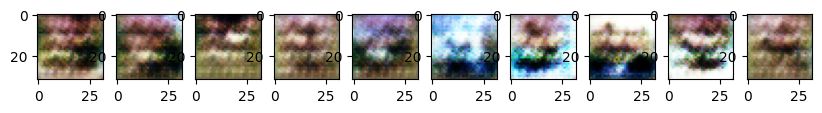

critic loss: 0.16138115525245667
generator loss: 0.581346333026886



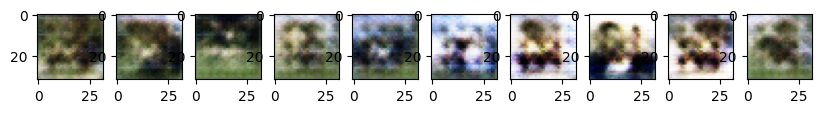

critic loss: 0.6359112858772278
generator loss: 0.15190063416957855



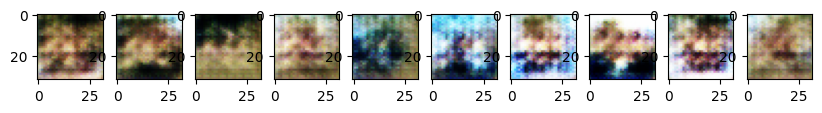

critic loss: 0.2999906837940216
generator loss: 2.1625216007232666



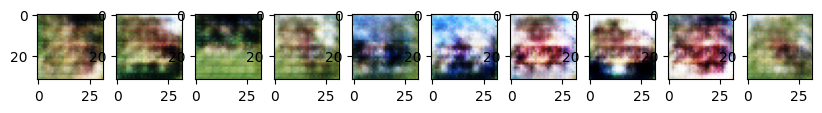

critic loss: 0.6121417880058289
generator loss: 0.16774383187294006



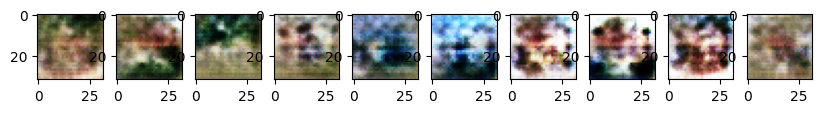

critic loss: 0.701801061630249
generator loss: 0.961104154586792



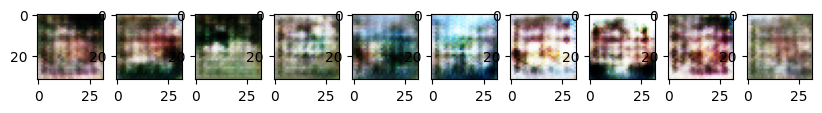

critic loss: 0.7304046154022217
generator loss: 0.3572675585746765



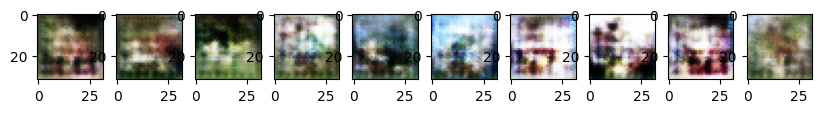

critic loss: 0.305494099855423
generator loss: 0.024365274235606194



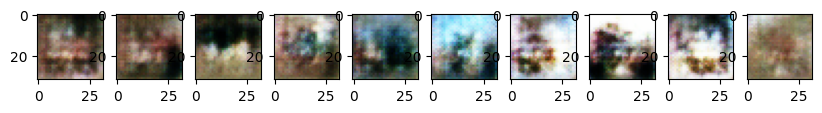

critic loss: 0.5538961887359619
generator loss: -0.2900981903076172



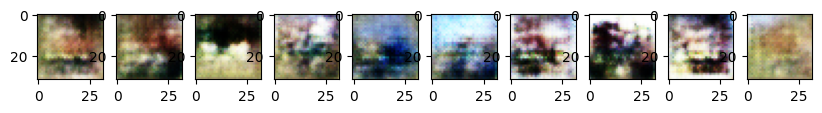

critic loss: 0.8307774066925049
generator loss: -0.6302313804626465



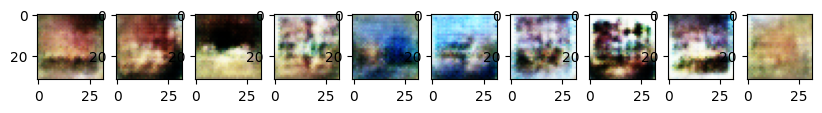

critic loss: 0.6279790997505188
generator loss: -0.14525100588798523



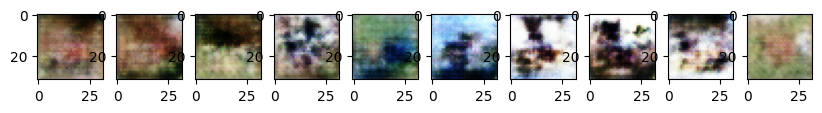

critic loss: 0.5639911890029907
generator loss: -0.5605611801147461



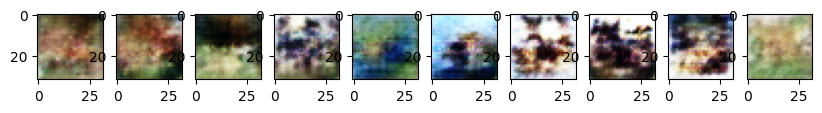

critic loss: 0.789971113204956
generator loss: 1.2255592346191406



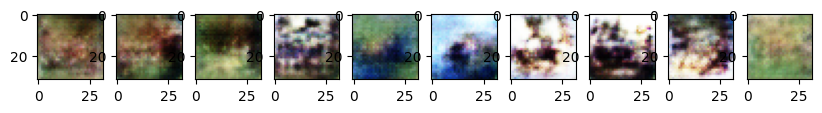

critic loss: 0.4107518494129181
generator loss: 0.23064982891082764



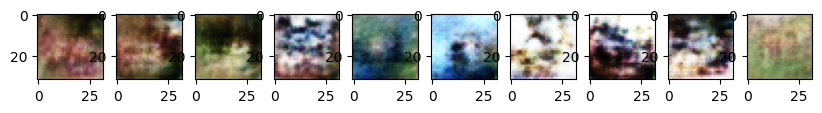

critic loss: 0.3788626790046692
generator loss: -1.1360617876052856



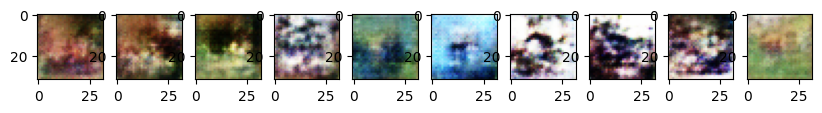

critic loss: 0.18104606866836548
generator loss: -0.9602792263031006



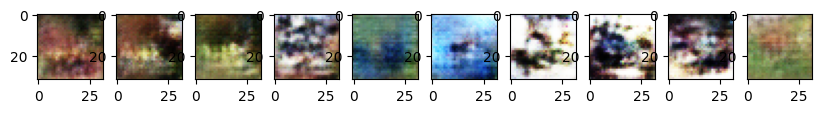

critic loss: 0.5104931592941284
generator loss: 0.03628962114453316



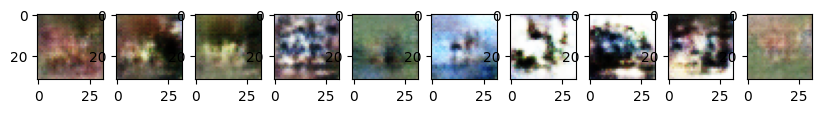

critic loss: 0.5057565569877625
generator loss: 1.828458547592163



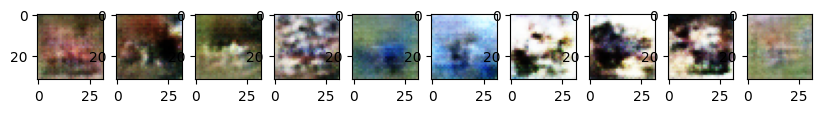

critic loss: 0.08315998315811157
generator loss: -1.4064067602157593



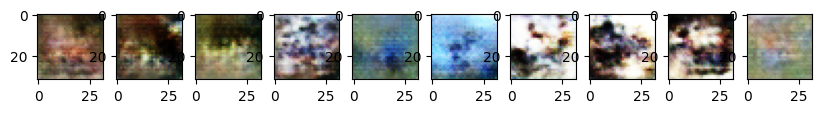

critic loss: 0.39388447999954224
generator loss: 1.2092411518096924



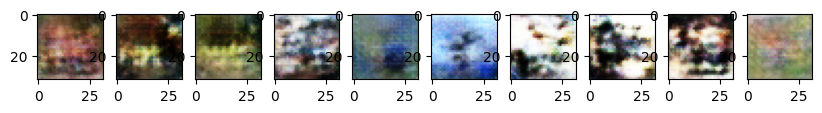

critic loss: 0.06593430787324905
generator loss: 0.7564602494239807



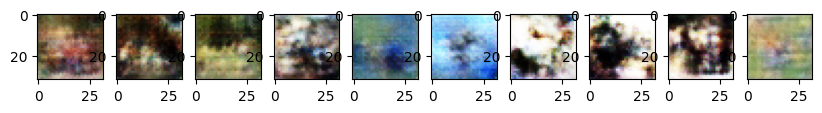

critic loss: 0.24499516189098358
generator loss: 0.16856037080287933



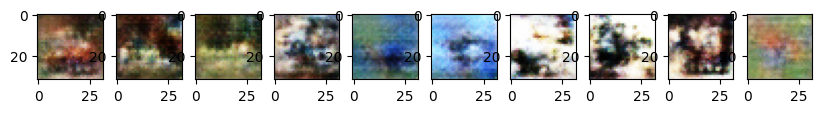

critic loss: 1.0697870254516602
generator loss: 1.1850665807724



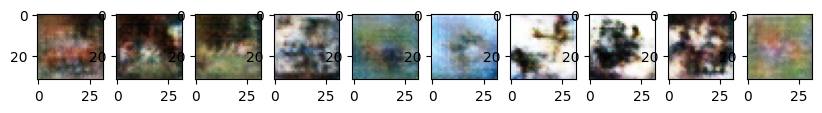

critic loss: 0.1890615075826645
generator loss: 1.2448866367340088



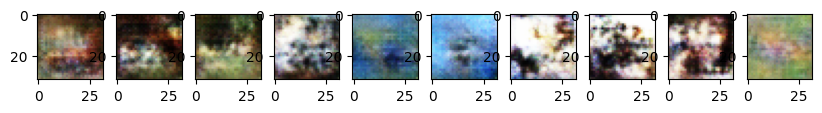

critic loss: 0.3134036958217621
generator loss: -0.19550731778144836



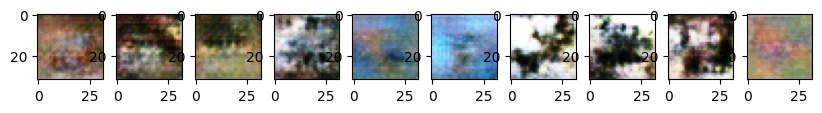

critic loss: 0.49747270345687866
generator loss: 0.2349027842283249



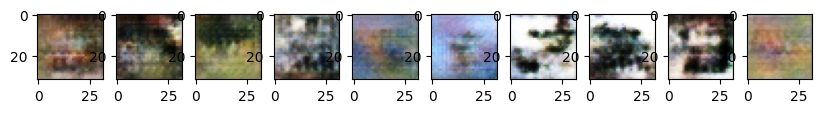

critic loss: 0.21520763635635376
generator loss: 0.725293755531311



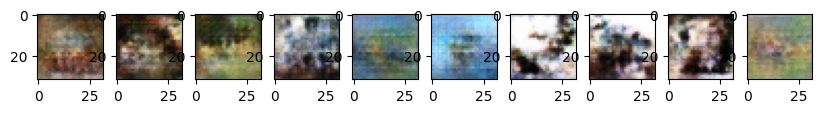

critic loss: 0.24238646030426025
generator loss: 0.796892523765564



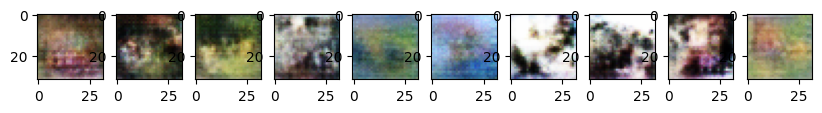

critic loss: 0.126521497964859
generator loss: 0.7737929821014404



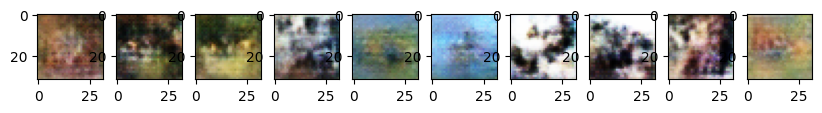

critic loss: 0.2983267307281494
generator loss: -0.47015470266342163



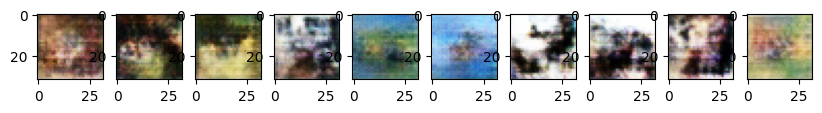

critic loss: 0.23753945529460907
generator loss: 0.058349609375



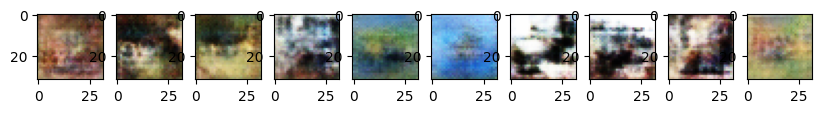

critic loss: 0.36059892177581787
generator loss: -1.406963586807251



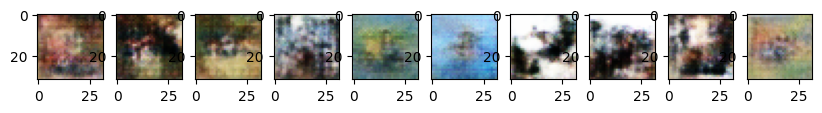

critic loss: 0.13438087701797485
generator loss: 1.5009077787399292



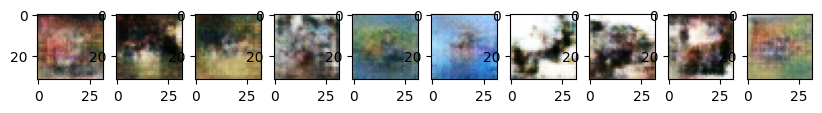

critic loss: 0.31031855940818787
generator loss: -0.4684698283672333



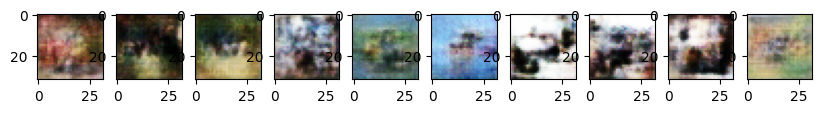

critic loss: 0.28358587622642517
generator loss: -0.17731426656246185



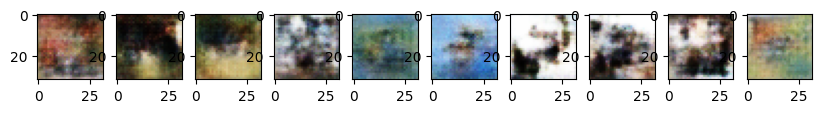

critic loss: 0.35190707445144653
generator loss: 0.5444695949554443



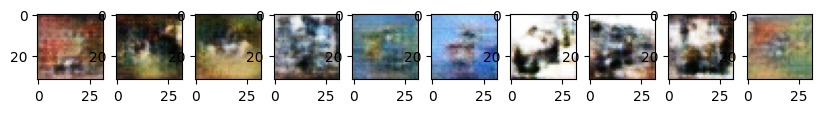

critic loss: 0.2733151614665985
generator loss: -0.33786413073539734



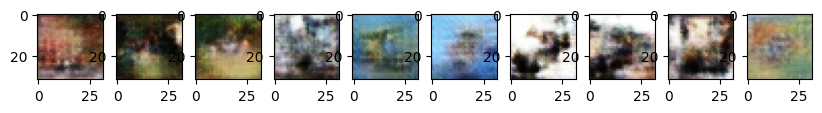

critic loss: 0.2886955142021179
generator loss: 0.8291150331497192



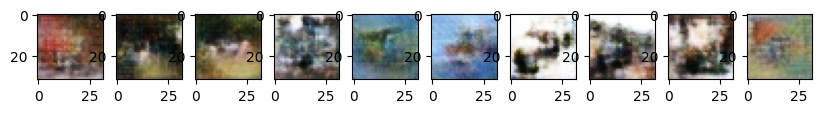

critic loss: 0.23038220405578613
generator loss: 0.2550775706768036



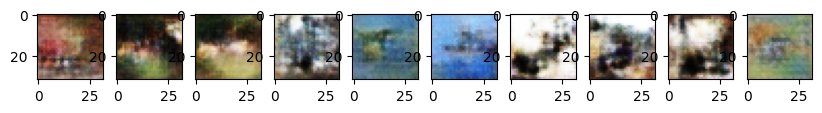

critic loss: 0.12370331585407257
generator loss: 0.15963876247406006



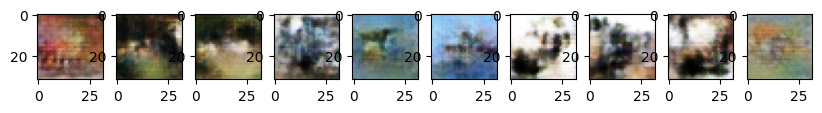

critic loss: 0.295852392911911
generator loss: -0.2729167640209198



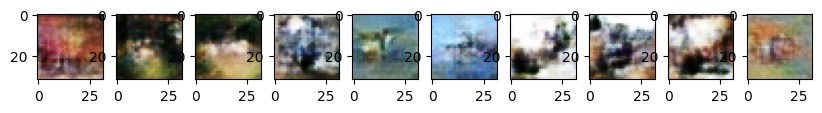

critic loss: 0.1624765843153
generator loss: 0.5201677680015564



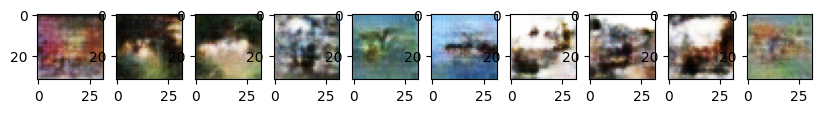

critic loss: 0.0852445438504219
generator loss: 0.8607406616210938



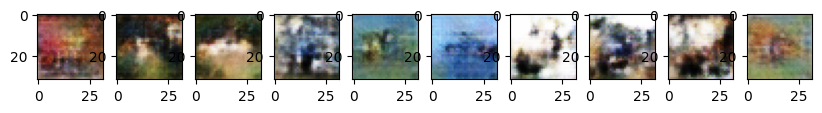

critic loss: 0.19117914140224457
generator loss: -0.305274099111557



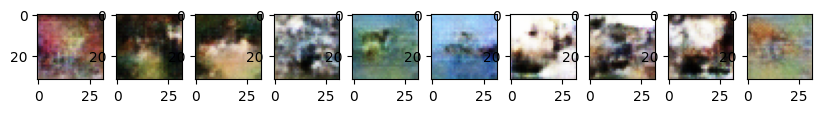

critic loss: 0.22573742270469666
generator loss: -0.6420818567276001



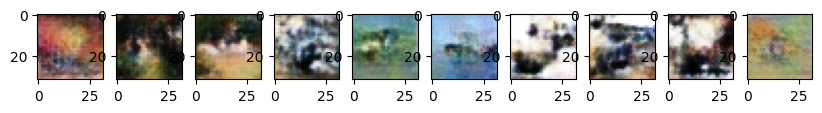

critic loss: 0.20989647507667542
generator loss: -0.16877393424510956



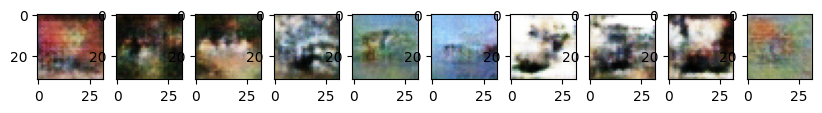

critic loss: 0.22299957275390625
generator loss: -0.4877612590789795



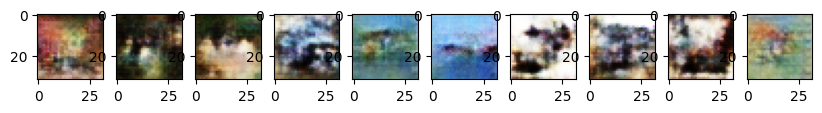

critic loss: 0.3479797840118408
generator loss: -0.03116113878786564



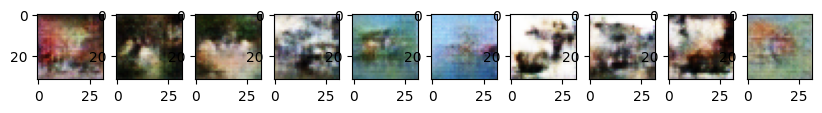

critic loss: 0.16014064848423004
generator loss: 1.0847058296203613



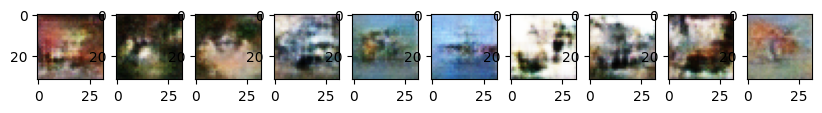

critic loss: 0.20812362432479858
generator loss: -0.31608712673187256



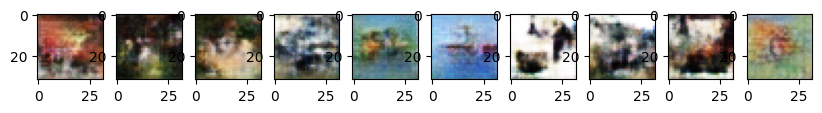

critic loss: 0.3274906873703003
generator loss: 0.628260612487793



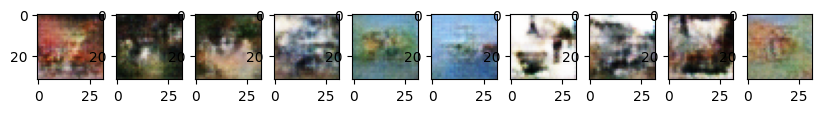

critic loss: 0.24922367930412292
generator loss: -0.24865400791168213



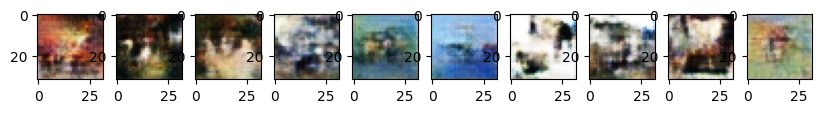

critic loss: 0.1255732923746109
generator loss: -0.3315013647079468



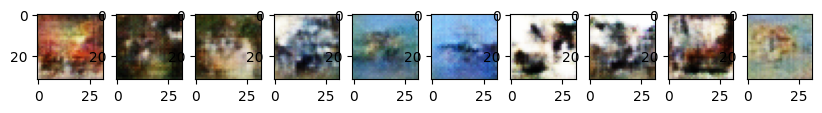

critic loss: 0.2894178628921509
generator loss: -1.0111684799194336



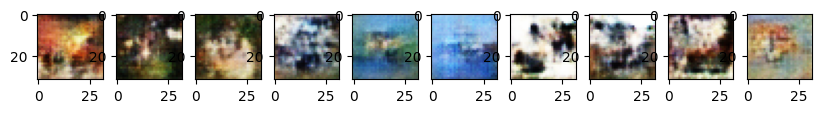

critic loss: 0.16369642317295074
generator loss: -0.03241026774048805



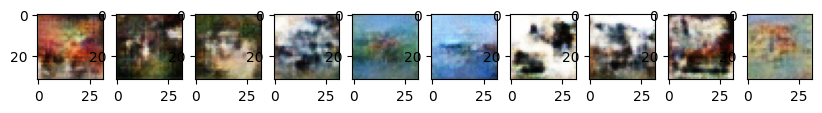

critic loss: 0.6929425001144409
generator loss: -0.2979690432548523



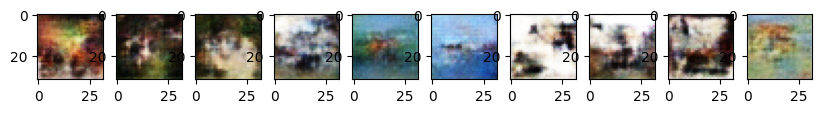

critic loss: 0.19322332739830017
generator loss: -0.55446857213974



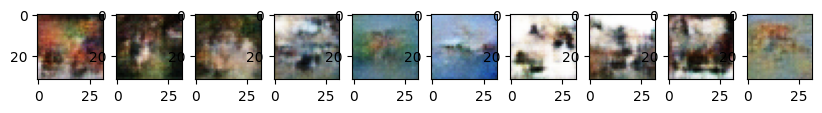

critic loss: 0.1679776906967163
generator loss: -0.12854310870170593



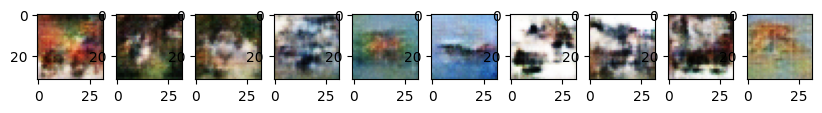

critic loss: 0.11023256927728653
generator loss: -0.4473191499710083



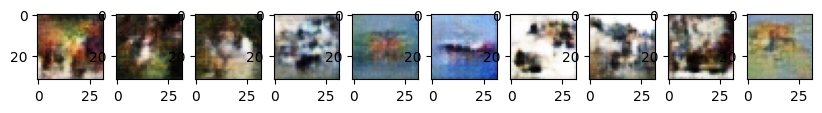

critic loss: 0.17580915987491608
generator loss: -0.11728797107934952



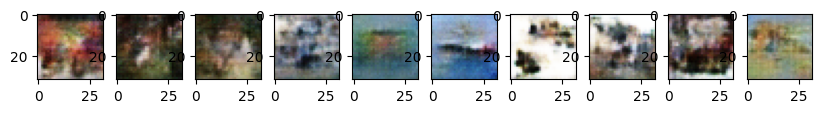

critic loss: 0.10378849506378174
generator loss: -0.17308245599269867



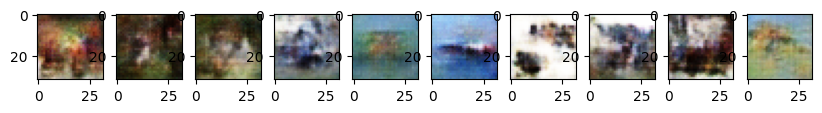

critic loss: 0.21878477931022644
generator loss: 0.05190306901931763



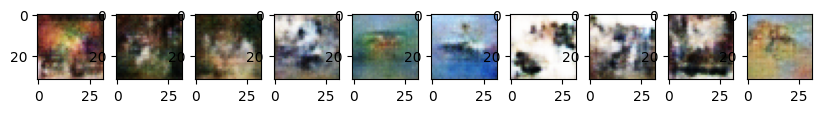

critic loss: 0.21394328773021698
generator loss: 0.0608198381960392



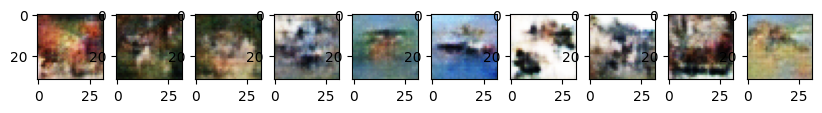

critic loss: 0.15709733963012695
generator loss: 0.3321978449821472



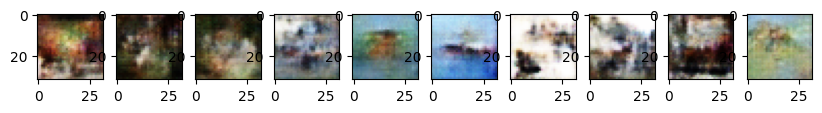

critic loss: 0.1545461118221283
generator loss: 0.7741907835006714



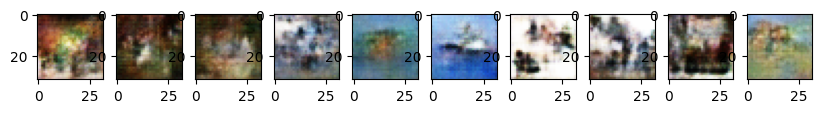

critic loss: 0.19318406283855438
generator loss: 0.7404254674911499



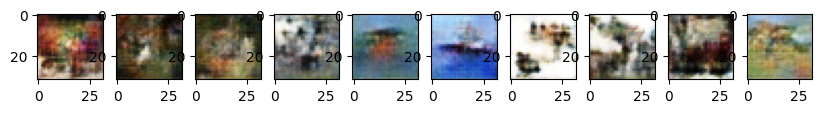

critic loss: 0.14547857642173767
generator loss: -0.4094027578830719



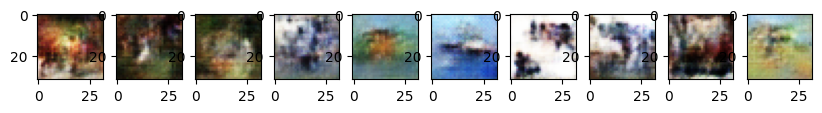

critic loss: 0.1650489717721939
generator loss: 0.10870898514986038



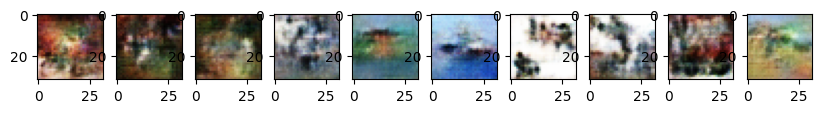

critic loss: 0.21489693224430084
generator loss: -0.16481159627437592



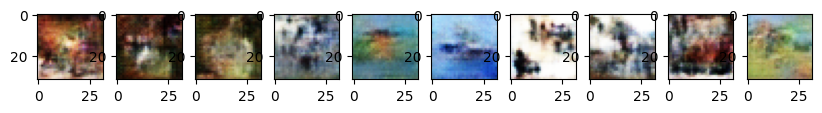

critic loss: 0.1972878873348236
generator loss: 0.3841027319431305



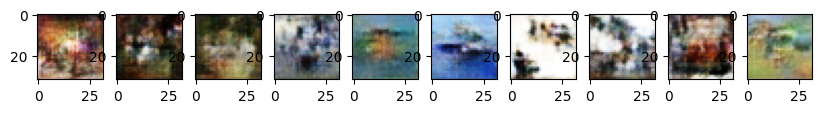

critic loss: 0.1822328269481659
generator loss: 0.2727987766265869



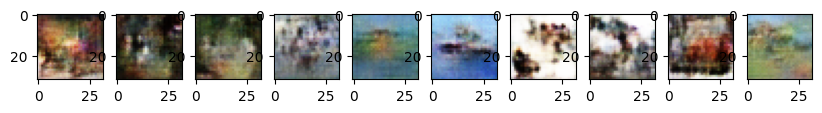

critic loss: 0.16622711718082428
generator loss: 0.16950993239879608



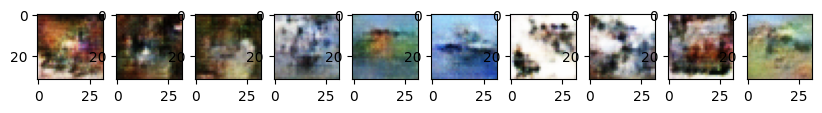

critic loss: 0.11408188939094543
generator loss: -0.30707669258117676



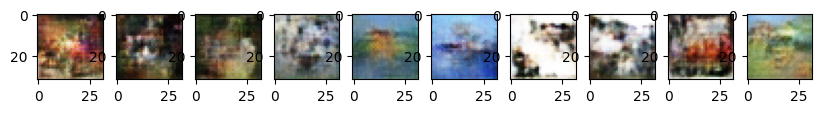

critic loss: 0.17233383655548096
generator loss: -0.16141118109226227



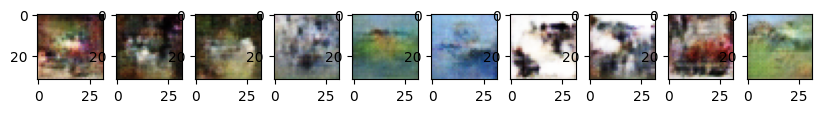

critic loss: 0.08457203209400177
generator loss: 0.47514569759368896



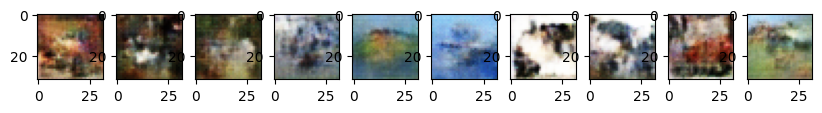

critic loss: 0.10109202563762665
generator loss: 0.12402036041021347



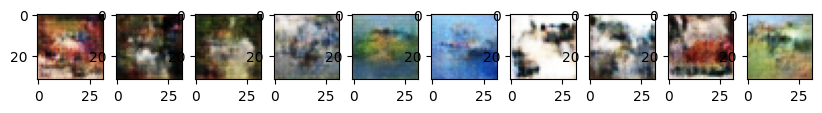

critic loss: 0.08836409449577332
generator loss: 0.9445720911026001



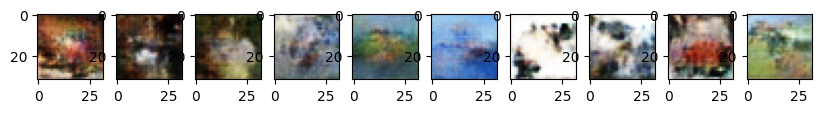

critic loss: 0.18566979467868805
generator loss: -0.3105027675628662



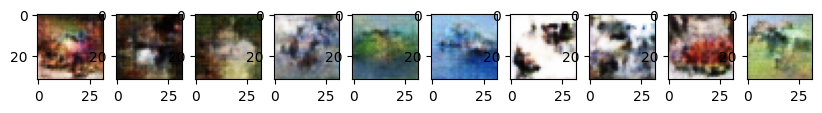

critic loss: 0.15044522285461426
generator loss: 0.6660333871841431



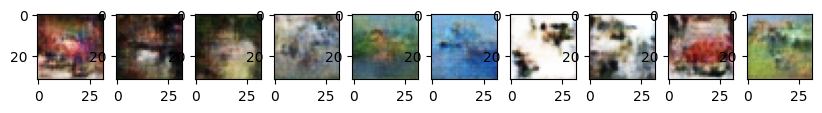

critic loss: 0.07114414870738983
generator loss: -0.6183827519416809



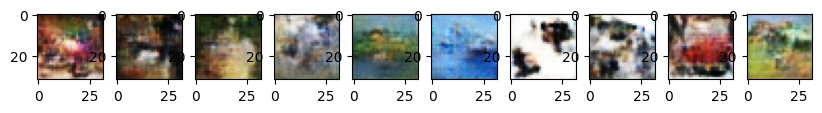

critic loss: 0.11749202013015747
generator loss: 0.2578229010105133



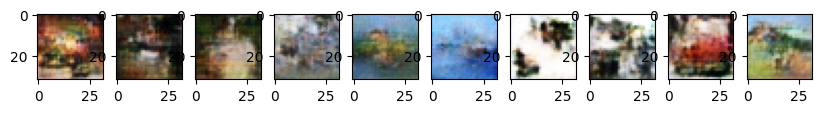

critic loss: 0.14885833859443665
generator loss: -0.06371037662029266



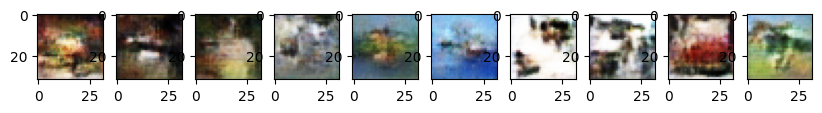

critic loss: 0.1610405147075653
generator loss: 0.292350709438324



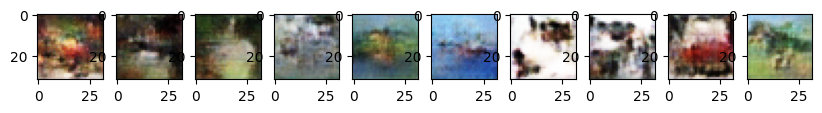

critic loss: 0.14561137557029724
generator loss: -0.05895446240901947



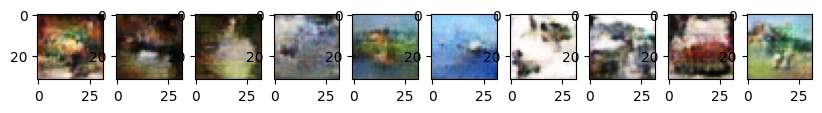

critic loss: 0.1256754994392395
generator loss: -0.037063486874103546



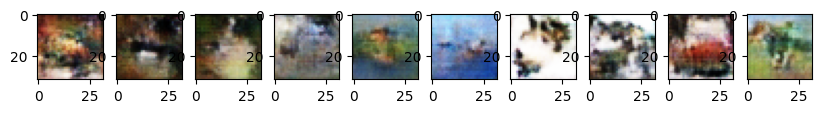

critic loss: 0.1346089094877243
generator loss: 0.4663171172142029



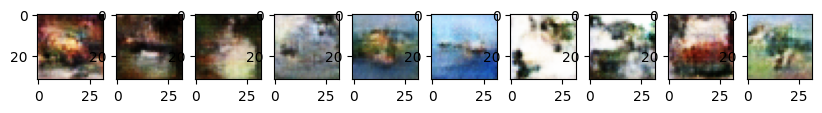

critic loss: 0.19362765550613403
generator loss: 0.06020762771368027



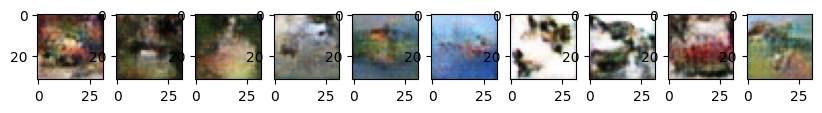

critic loss: 0.08824453502893448
generator loss: 0.14526832103729248



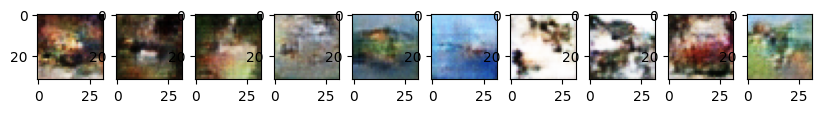

critic loss: 0.1015307754278183
generator loss: -0.02564474195241928



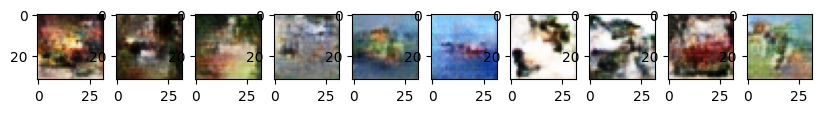

critic loss: 0.10586883127689362
generator loss: -0.40779829025268555



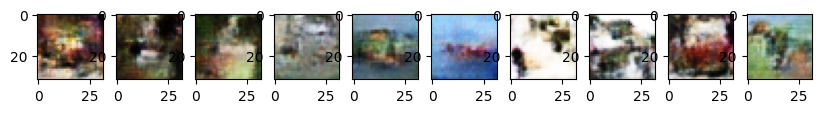

critic loss: 0.14080582559108734
generator loss: -0.5010237097740173



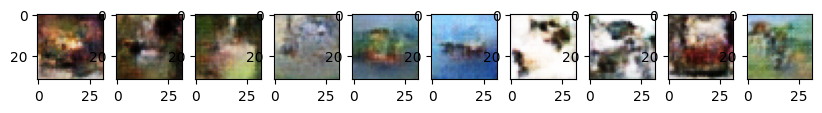

critic loss: 0.7807518839836121
generator loss: 0.5190786123275757



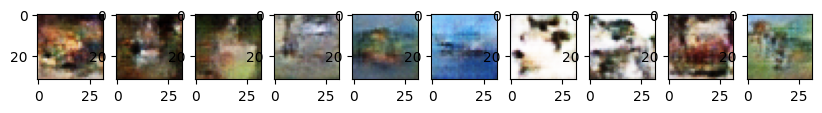

critic loss: 0.03367222473025322
generator loss: 0.5133086442947388



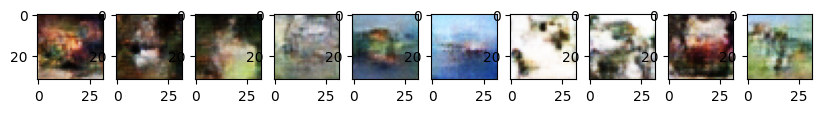

critic loss: 0.1094195619225502
generator loss: 0.07946084439754486



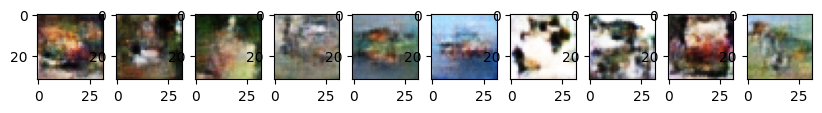

critic loss: 0.10413956642150879
generator loss: 0.0778900682926178



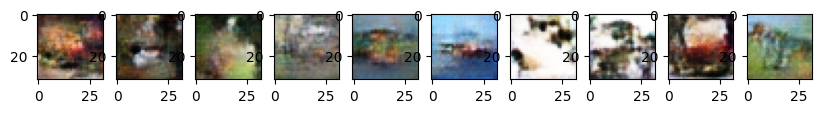

critic loss: 0.1320217400789261
generator loss: 0.010275691747665405



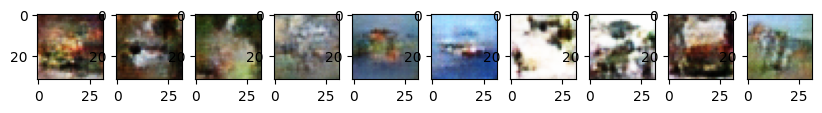

critic loss: 0.08178472518920898
generator loss: 0.41465139389038086



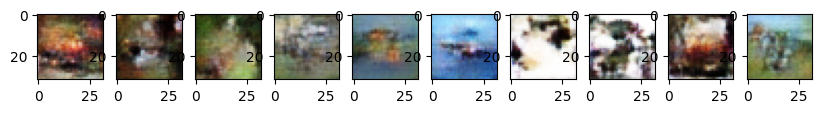

critic loss: 0.11357942968606949
generator loss: -0.1312583088874817



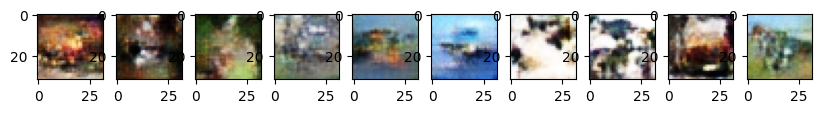

critic loss: 0.10115979611873627
generator loss: 0.4802466332912445



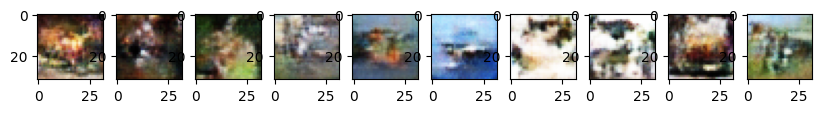

critic loss: 0.11484305560588837
generator loss: -0.38971129059791565



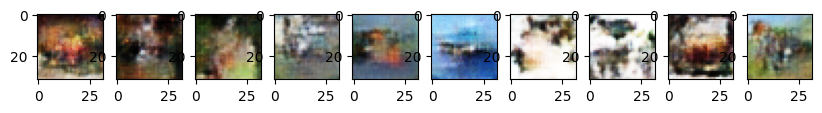

critic loss: 0.1490963250398636
generator loss: -0.12299851328134537



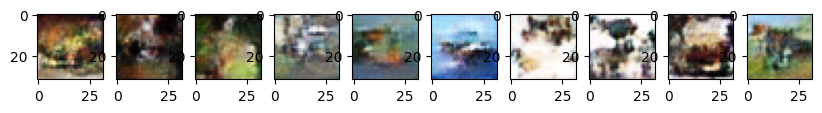

critic loss: 0.18164527416229248
generator loss: 0.09761550277471542



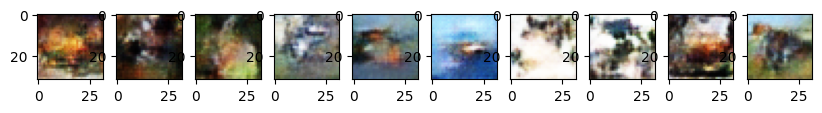

critic loss: 0.13183286786079407
generator loss: 0.29192590713500977



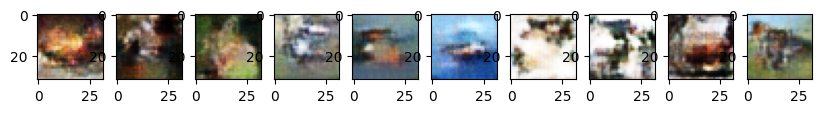

critic loss: 0.1091272383928299
generator loss: 0.21121084690093994



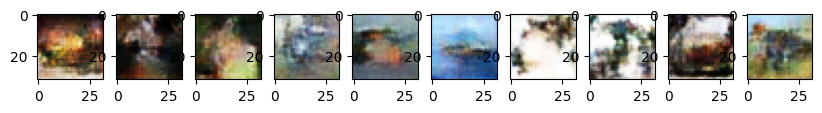

critic loss: 0.07375059276819229
generator loss: 0.5348024368286133



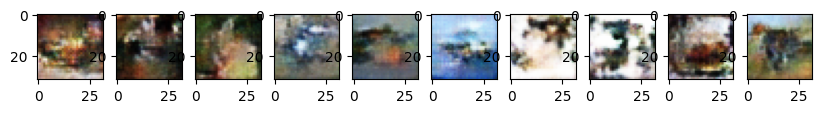

critic loss: 0.14780113101005554
generator loss: 0.022410454228520393



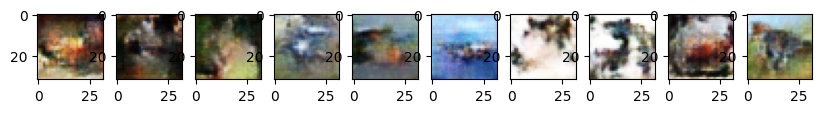

critic loss: 0.08235915005207062
generator loss: 0.06825609505176544



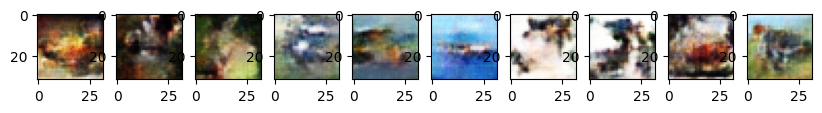

critic loss: 0.07947178184986115
generator loss: -0.045559097081422806



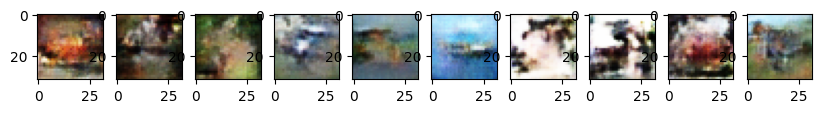

critic loss: 0.05756380036473274
generator loss: -0.3265848755836487



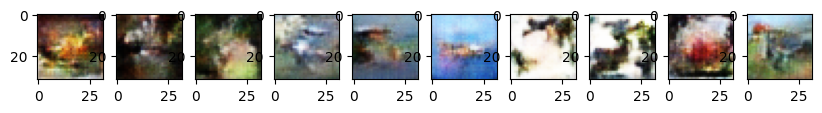

critic loss: 0.2002987563610077
generator loss: -0.08069941401481628



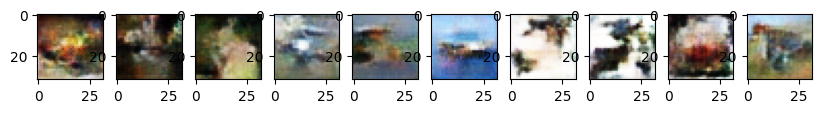

critic loss: 0.15952567756175995
generator loss: -0.5876388549804688



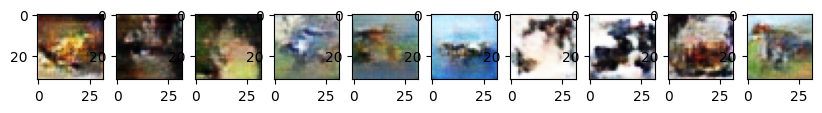

critic loss: 0.068659707903862
generator loss: -0.33409711718559265



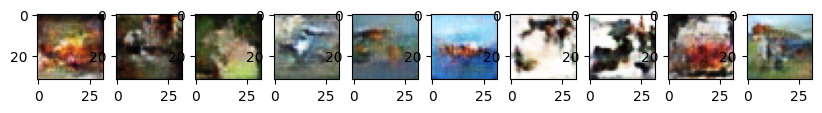

critic loss: 0.17853353917598724
generator loss: 0.16109618544578552



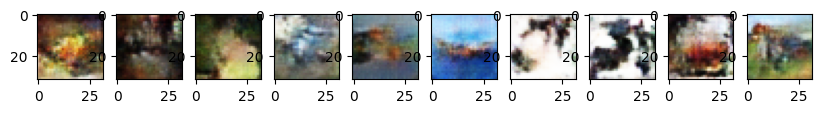

critic loss: 0.0971350222826004
generator loss: -0.42449653148651123



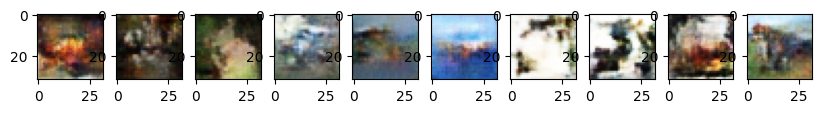

critic loss: 0.25440406799316406
generator loss: 0.15854421257972717



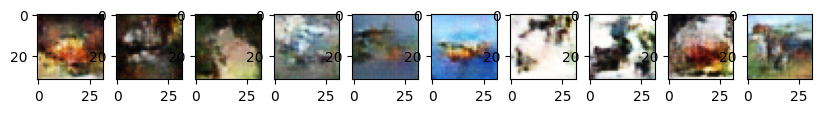

critic loss: 0.0874890387058258
generator loss: -0.25088557600975037



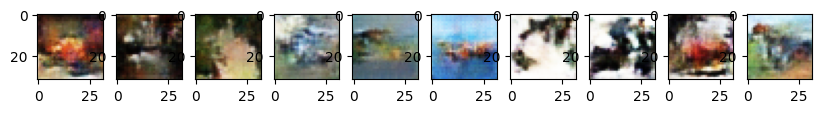

critic loss: 0.1521945595741272
generator loss: 0.037084780633449554



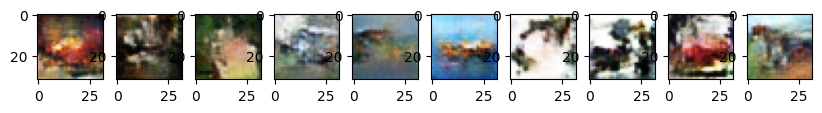

critic loss: 0.13952913880348206
generator loss: -0.19606445729732513



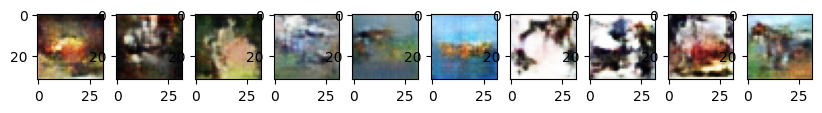

critic loss: 0.14826762676239014
generator loss: -0.22058817744255066



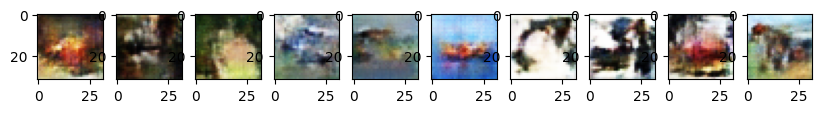

critic loss: 0.08986761420965195
generator loss: 0.26459094882011414



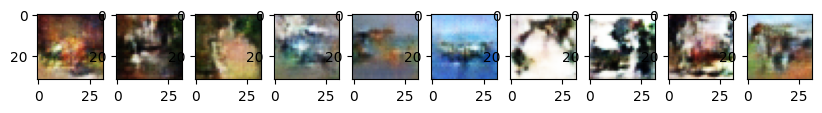

critic loss: 0.17492663860321045
generator loss: -0.31011492013931274



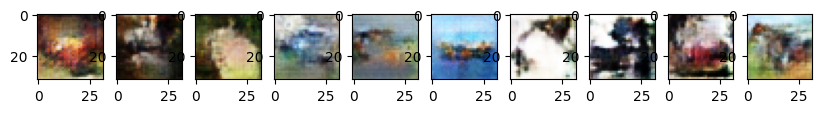

critic loss: 0.08485278487205505
generator loss: -0.006285226903855801



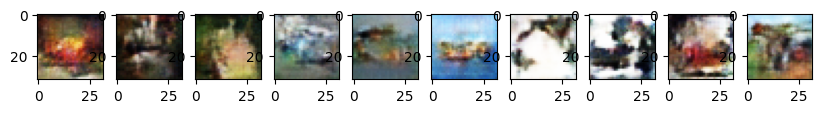

critic loss: 0.0904359519481659
generator loss: 0.15600229799747467



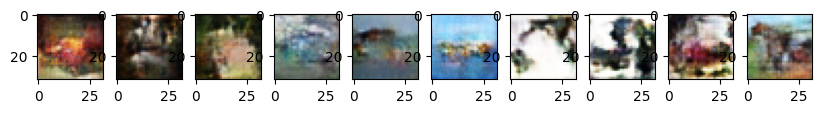

critic loss: 0.1462583988904953
generator loss: 0.11813043057918549



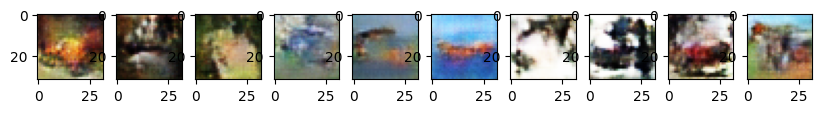

critic loss: 0.08581351488828659
generator loss: 0.15103286504745483



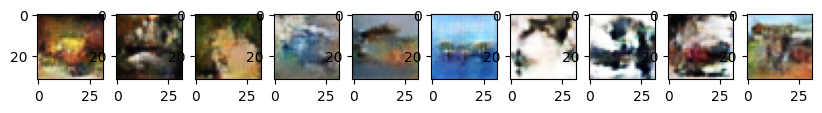

critic loss: 0.1117914691567421
generator loss: -0.03834450617432594



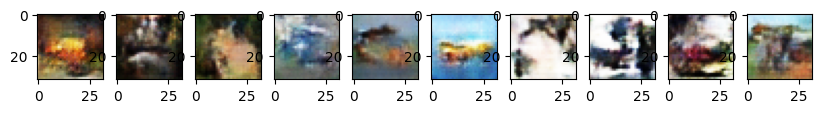

critic loss: 0.1059737503528595
generator loss: -0.08552651107311249



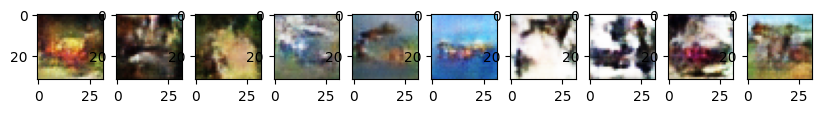

critic loss: 0.12686462700366974
generator loss: -0.22421234846115112



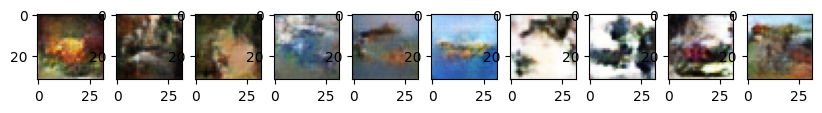

critic loss: 0.22138400375843048
generator loss: -0.42014479637145996



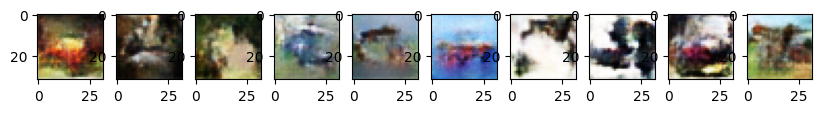

critic loss: 0.10928644239902496
generator loss: 0.20803938806056976



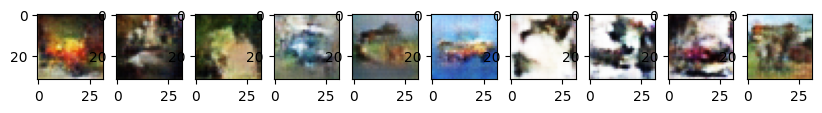

critic loss: 0.06529287993907928
generator loss: -0.6406182646751404



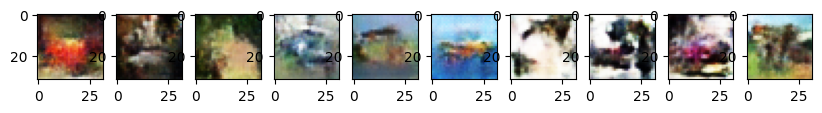

critic loss: 0.13799646496772766
generator loss: 0.18781724572181702



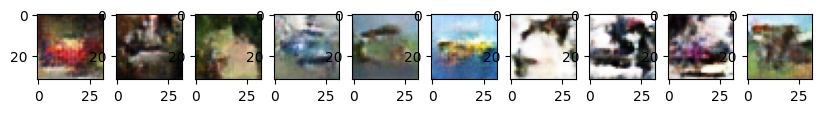

critic loss: 0.08683758974075317
generator loss: -0.49527814984321594



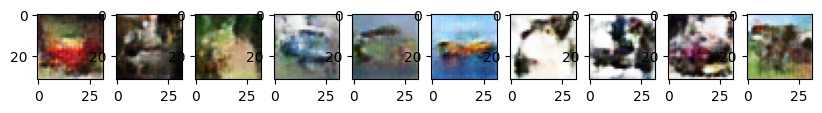

critic loss: 0.07236425578594208
generator loss: 0.33940431475639343



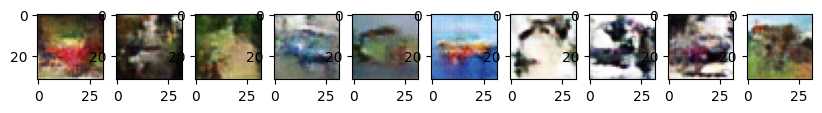

critic loss: 0.12607727944850922
generator loss: -0.2864759862422943



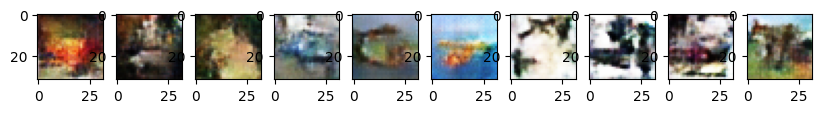

critic loss: 0.11590322107076645
generator loss: 0.0827874094247818



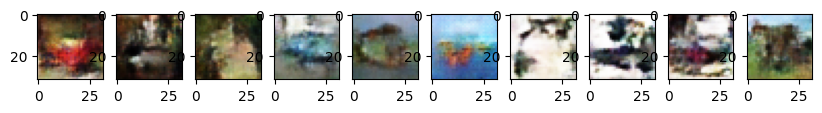

critic loss: 0.08741936087608337
generator loss: 0.07836851477622986



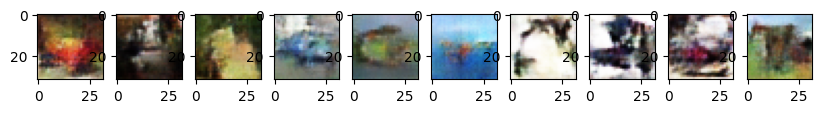

critic loss: 0.022296439856290817
generator loss: 0.14964669942855835



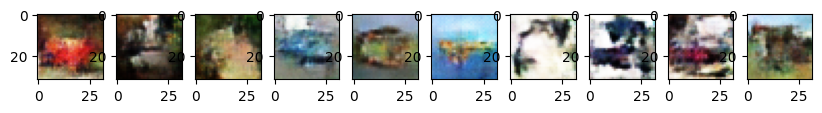

critic loss: 0.11363047361373901
generator loss: 0.06238483637571335



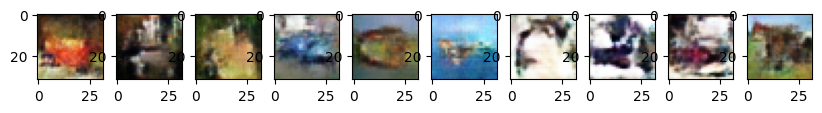

critic loss: 0.16267448663711548
generator loss: -0.009604052640497684



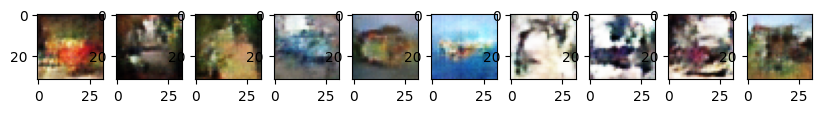

critic loss: 0.1967327743768692
generator loss: 0.03202065825462341



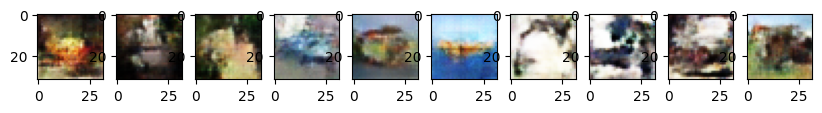

critic loss: 0.0781700611114502
generator loss: 0.013056219555437565



In [ ]:
epochs = 100

log_critic_loss = []
log_generator_loss = []

plot_noise = torch.randn((10, N_NOISE, 1, 1), device=device)

for epoch in range(1, epochs+1):
  for i, data in enumerate(trainloader):
    images, _ = data
    images = images.to(device)
    
    # updating the critic
    critic.zero_grad()

    ## calculating the score for real images
    real_scores = critic(images).view(-1)

    ## calculating the score for fake images
    noise = torch.randn((images.shape[0], N_NOISE, 1, 1), device=device)
    generated_images = generator(noise)

    fake_scores = critic(generated_images.detach()).view(-1)

    loss = critic_loss(real_scores, fake_scores) + LAMBDA * gradient_penalty(images, generated_images)
    loss.backward()
    critic_optimizer.step()

    log_critic_loss.append(loss.detach().cpu().item())
    
    #updating the generator
    generator.zero_grad()

    noise = torch.randn((BATCH_SIZE, N_NOISE, 1, 1), device=device)
    generated_images = generator(noise)
    scores = critic(generated_images).view(-1)

    loss = generator_loss(scores)
    loss.backward()
    generator_optimizer.step()

    log_generator_loss.append(loss.detach().cpu().item())

    if (i + 1) % 50 == 0:
      print(f'critic loss: {log_critic_loss[-1]}')
      print(f'generator loss: {log_generator_loss[-1]}')
      print()
      plot_generated_images(plot_noise)

In [ ]:
plt.plot(log_critic_loss, color='red')
plt.plot(log_generator_loss, color='blue')